In [1]:
# imports
import os, sys

# third party imports
import numpy as np
import tqdm
import tensorflow as tf
import voxelmorph as vxm
import neurite as ne
import matplotlib.pyplot as plt

2022-10-08 00:32:37.330945: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-08 00:32:37.633161: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-08 00:32:38.435692: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/verkira/.conda/envs/tf/lib/
2022-10-08 00:32:38.435787: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.s

In [2]:
# Conform test data.
def conform(x, in_shape = (256,) * 2):
    '''Resize and normalize image.'''
    x = np.float32(x)
    x = ne.utils.minmax_norm(x)
    x = ne.utils.zoom(x, zoom_factor=[o / i for o, i in zip(in_shape, x.shape)])
    return np.expand_dims(x, axis=(0, -1))


In [3]:
def plot_history(hist, loss_name='loss'):
    # Simple function to plot training history.
    plt.figure()
    plt.plot(hist.epoch, hist.history[loss_name], '.-')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.show()

In [4]:
def vxm_data_generator_hybrid(real_generator, synth_generator, alpha_real=0.9, batch_size=32):
    """
    Generator that takes in data of size [N, H, W], and yields data for
    our custom vxm model. Note that we need to provide numpy data for each
    input, and each output.

    inputs:  moving [bs, H, W, 1], fixed image [bs, H, W, 1]
    outputs: moved image [bs, H, W, 1], zero-gradient [bs, H, W, 2]
    """    
    while True:
        if np.random.rand()<alpha_real:
          yield next(synth_generator)
        else:          
          yield next(real_generator)

In [5]:
def vxm_data_generator_real(x_data, batch_size=32):
    """
    Generator that takes in data of size [N, H, W], and yields data for
    our custom vxm model. Note that we need to provide numpy data for each
    input, and each output.

    inputs:  moving [bs, H, W, 1], fixed image [bs, H, W, 1]
    outputs: moved image [bs, H, W, 1], zero-gradient [bs, H, W, 2]
    """

    # preliminary sizing
    vol_shape = x_data.shape[1:] # extract data shape
    ndims = len(vol_shape)
    
    # prepare a zero array the size of the deformation
    # we'll explain this below
    zero_phi = np.zeros([batch_size, *vol_shape, ndims])
    
    while True:
        # prepare inputs:
        # images need to be of the size [batch_size, H, W, 1]
        idx1 = np.random.randint(0, x_data.shape[0], size=batch_size)
        moving_images = x_data[idx1, ..., np.newaxis]
        idx2 = np.random.randint(0, x_data.shape[0], size=batch_size)
        fixed_images = x_data[idx2, ..., np.newaxis]
        inputs = [moving_images, fixed_images]
        
        # prepare outputs (the 'true' moved image):
        # of course, we don't have this, but we know we want to compare 
        # the resulting moved image with the fixed image. 
        # we also wish to penalize the deformation field. 
        outputs = [fixed_images, zero_phi]
        
        yield (inputs, outputs)

def vxm_data_generator_synth(x_data, label_to_image, batch_size=32):
    """
    Generator that takes in data of size [N, H, W], and yields data for
    our custom vxm model. Note that we need to provide numpy data for each
    input, and each output.

    inputs:  moving [bs, H, W, 1], fixed image [bs, H, W, 1]
    outputs: moved image [bs, H, W, 1], zero-gradient [bs, H, W, 2]
    """

    # preliminary sizing
    vol_shape = x_data.shape[1:] # extract data shape
    ndims = len(vol_shape)
    
    # prepare a zero array the size of the deformation
    # we'll explain this below
    zero_phi = np.zeros([batch_size, *vol_shape, ndims])
    
    while True:
        # prepare inputs:
        # images need to be of the size [batch_size, H, W, 1]
        idx1 = np.random.randint(0, x_data.shape[0], size=batch_size)
        moving_images = x_data[idx1, ..., np.newaxis]
        idx2 = np.random.randint(0, x_data.shape[0], size=batch_size)
        fixed_images = x_data[idx2, ..., np.newaxis]
        inputs = [label_to_image(moving_images), label_to_image(fixed_images)]
        
        # prepare outputs (the 'true' moved image):
        # of course, we don't have this, but we know we want to compare 
        # the resulting moved image with the fixed image. 
        # we also wish to penalize the deformation field. 
        outputs = [fixed_images, zero_phi]
        
        yield (inputs, outputs)

In [6]:
class SynthLabels():
    def __init__(self, num_label=16, num_maps=250):
        # Input shapes.
        self.in_shape = (256,) * 2
        self.num_dim = len(self.in_shape)
        self.num_label = num_label
        self.num_maps = num_maps
        gen_arg = dict(
            in_shape=self.in_shape,
            in_label_list=np.arange(16),
            warp_std=3,
            warp_res=(8, 16, 32),
        )
        self.gen_model = ne.models.labels_to_image(**gen_arg, id=1)

    def label_maps(self):
        # Shape generation.
        self.label_maps = []
        self.label_maps = np.zeros((self.num_maps, 256, 256))
        for i in tqdm.tqdm(range(self.num_maps)):
            # Draw image and warp.
            im = ne.utils.augment.draw_perlin(
                out_shape=(*self.in_shape, self.num_label),
                scales=(32, 64), max_std=1,
            )
            warp = ne.utils.augment.draw_perlin(
                out_shape=(*self.in_shape, self.num_label, self.num_dim),
                scales=(16, 32, 64), max_std=16,
            )
            # Transform and create label map.
            im = vxm.utils.transform(im, warp)
            lab = tf.argmax(im, axis=-1)
            self.label_maps[i] = np.uint8(lab)
        return self.label_maps
    
    def visualize_labels(self, num_row = 2, per_row = 10):
        # Visualize shapes.
        for i in range(0, num_row * per_row, per_row):
            ne.plot.slices(self.label_maps[i:i + per_row], cmaps=['tab20c']) 
    
    def label_to_image(self, sample):
      return self.gen_model.predict(sample)[0]

2022-10-08 00:32:40.482681: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-08 00:32:40.553511: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-08 00:32:40.553737: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-08 00:32:40.554239: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

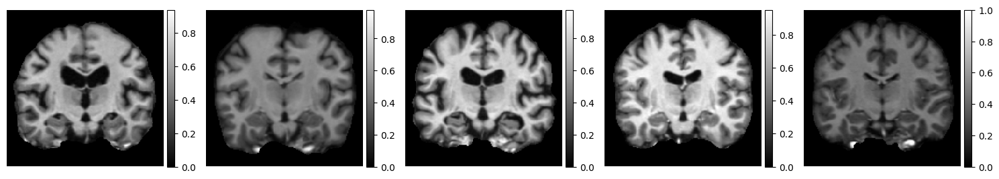

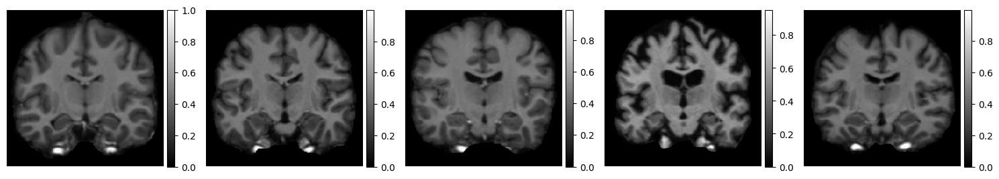

In [7]:
#Loading the dataset
images = ne.py.data.load_dataset('2D-OASIS-TUTORIAL')
conformed_images = [conform(img) for img in images]
#label_maps_real = [(img*15).astype('int').reshape(256, 256) for img in conformed_images]
label_maps_real = [img.reshape(256, 256) for img in conformed_images]


# Visualizing the dataset.
num_row = 2
per_row = 5
for i in range(0, num_row * per_row, per_row):
    ne.plot.slices(label_maps_real[i:i + per_row], cmaps=['gray'], do_colorbars=True)

In [8]:
class VxmTest():
    def __init__(self, ndim = 2, unet_input_features = 2):
        self.ndim = ndim
        self.unet_input_features = unet_input_features
    #CNN model
        # configure unet input shape (concatenation of moving and fixed images)
        self.vol_shape = real_train.shape[1:]
        # configure unet features 
        self.nb_features = [
            [32, 32, 32, 32],         # encoder features
            [32, 32, 32, 32, 32, 16]  # decoder features
        ]
        
        
    def CNNvxm(self, real_gen=None, synth_gen=None, val_generator=None, alpha_real=0.9):
        self.vxm_model = vxm.networks.VxmDense(self.vol_shape, nb_unet_features=None, int_steps=0)
        self.losses = ['mse', vxm.losses.Grad('l2').loss]
        self.loss_weights = [1, 0.01]
        self.vxm_model.compile(optimizer=tf.keras.optimizers.Adam(lr=1e-4), loss=self.losses, loss_weights=self.loss_weights)
        
        if synth_gen is None:
          self.train_generator = real_gen
        elif real_gen is None:
          self.train_generator = synth_gen
        else:
          self.train_generator = vxm_data_generator_hybrid(real_gen, synth_gen, alpha_real=alpha_real)
        self.val_generator = val_generator

        self.in_sample, self.out_sample = next(self.train_generator)
        def Visual():
            # visualize
            images = [img[0, :, :, 0] for img in self.in_sample + self.out_sample]
            titles = ['moving', 'fixed', 'moved ground-truth (fixed)', 'zeros']
            ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);
        Visual()
        
    def train(self, total_epo):
        self.hist = self.vxm_model.fit(self.train_generator, epochs=total_epo,
                                       steps_per_epoch=10, verbose=2,
                                       validation_data=self.val_generator,
                                       validation_steps = 100);
        plot_history(self.hist)
        
    def RegPred(self, val_input):
        self.val_pred = self.vxm_model.predict(val_input)
        #visualise
        def Visual():
            images = [img[0, :, :, 0] for img in val_input + self.val_pred] 
            titles = ['moving', 'fixed', 'moved', 'flow']
            ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);
        Visual()
        return self.val_pred

In [9]:
SynthIm = SynthLabels()
label_maps_synth = SynthIm.label_maps()
#SynthIm.visualize_labels()

100%|█████████████████████████████████████████| 250/250 [01:16<00:00,  3.28it/s]


In [12]:
#Fixing data + spliting

#conversion of labels in range of [0,1]
label_maps_real = np.array(label_maps_real)
label_maps_synth = np.array(label_maps_synth)
#label_maps_real = label_maps_real.astype('float')/15
#label_maps_synth = label_maps_synth.astype('float')/15
#label_maps_hy = np.zeros((250, 256, 256))
#label_maps_hy[::2] = [i for i in label_maps_real[:125, ...]]
#label_maps_hy[1::2] = [i for i in label_maps_synth[:125, ...]]
#label_maps_hy = np.array(label_maps_hy)

#data split 
Data_split_train = 250
real_train = label_maps_real[:250, ...]
few_shot_train = label_maps_real[:50, ...]
test_val_no = 82
real_val = label_maps_real[250:332, ...]
real_test = label_maps_real[-82:, ...]

In [13]:
# create the few shot data generator
few_generator = vxm_data_generator_real(real_train, batch_size = 8)
few_input, _ = next(few_generator)

# create the training data generator
train_generator = vxm_data_generator_real(real_train, batch_size = 8)
train_input, _ = next(train_generator)

# create the validation data generator
val_generator = vxm_data_generator_real(real_val, batch_size = 8)
val_input, _ = next(val_generator)

# create synthetic data generator
synth_generator = vxm_data_generator_synth(label_maps_synth, SynthIm.label_to_image, batch_size=8)
synth_input, _ = next(synth_generator)

1/1 [==============================] - 0s 59ms/step


1/1 [==============================] - 0s 62ms/step


/home/verkira/.conda/envs/tf/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 63ms/step
Epoch 1/2
1/1 [==============================] - 0s 62ms/step
10/10 - 13s - loss: 70.2695 - vxm_dense_transformer_loss: 70.2695 - vxm_dense_flow_loss: 5.7239e-07 - val_loss: 0.0306 - val_vxm_dense_transformer_loss: 0.0306 - val_vxm_dense_flow_loss: 8.5646e-07 - 13s/epoch - 1s/step
Epoch 2/2
1/1 [==============================] - 0s 249ms/step
10/10 - 8s - loss: 71.6514 - vxm_dense_transformer_loss: 71.6514 - vxm_dense_flow_loss: 1.3265e-05 - val_loss: 0.0312 - val_vxm_dense_transformer_loss: 0.0312 - val_vxm_dense_flow_loss: 1.4255e-05 - 8s/epoch - 793ms/step


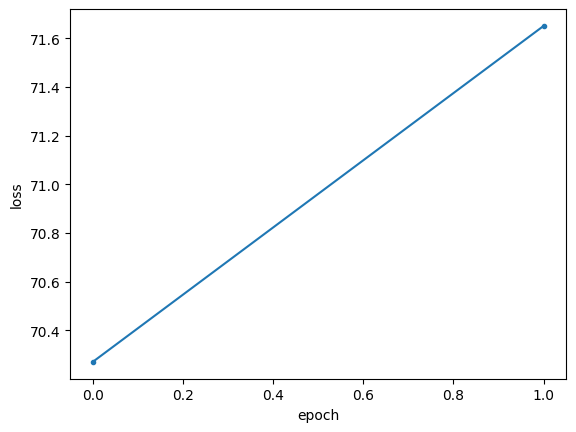

In [14]:
train_no = 2000

Synth = VxmTest()
Synth.CNNvxm(real_gen=None, synth_gen=synth_generator, val_generator=val_generator)
Synth.train(total_epo=train_no)

Epoch 1/2
10/10 - 8s - loss: 0.0252 - vxm_dense_transformer_loss: 0.0252 - vxm_dense_flow_loss: 7.1849e-07 - val_loss: 0.0304 - val_vxm_dense_transformer_loss: 0.0304 - val_vxm_dense_flow_loss: 3.7548e-06 - 8s/epoch - 788ms/step
Epoch 2/2
10/10 - 5s - loss: 0.0257 - vxm_dense_transformer_loss: 0.0257 - vxm_dense_flow_loss: 1.5700e-05 - val_loss: 0.0315 - val_vxm_dense_transformer_loss: 0.0315 - val_vxm_dense_flow_loss: 6.1971e-05 - 5s/epoch - 525ms/step


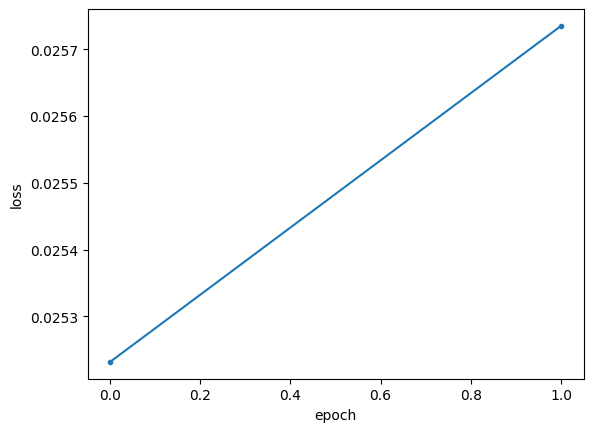

In [15]:
Real = VxmTest()
Real.CNNvxm(real_gen=train_generator, synth_gen=None, val_generator=val_generator)
Real.train(total_epo=train_no)

Epoch 1/2
10/10 - 8s - loss: 0.0285 - vxm_dense_transformer_loss: 0.0285 - vxm_dense_flow_loss: 1.0098e-07 - val_loss: 0.0322 - val_vxm_dense_transformer_loss: 0.0322 - val_vxm_dense_flow_loss: 4.7488e-07 - 8s/epoch - 790ms/step
Epoch 2/2
1/1 [==============================] - 0s 57ms/step
10/10 - 6s - loss: 6.5010 - vxm_dense_transformer_loss: 6.5010 - vxm_dense_flow_loss: 1.0648e-06 - val_loss: 0.0318 - val_vxm_dense_transformer_loss: 0.0318 - val_vxm_dense_flow_loss: 1.1605e-06 - 6s/epoch - 577ms/step


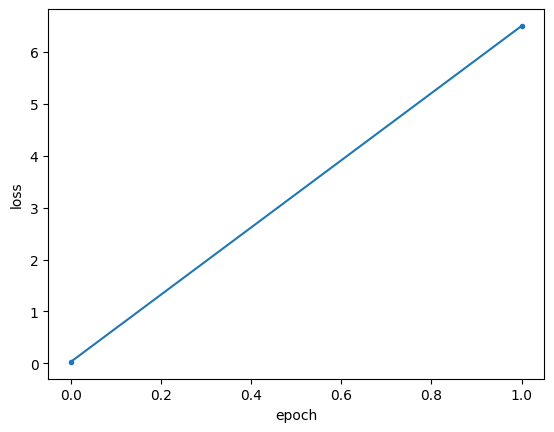

1/1 [==============================] - 0s 329ms/step


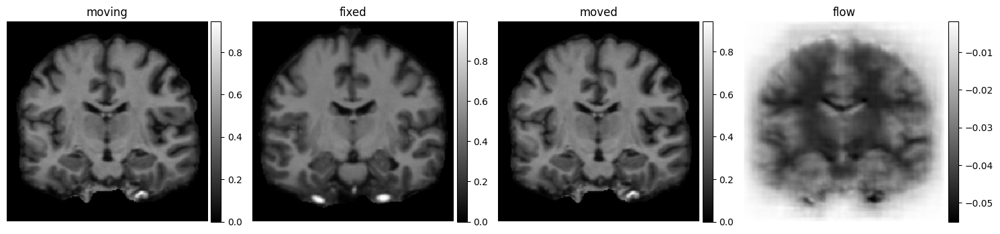

Epoch 1/2
1/1 [==============================] - 0s 56ms/step
10/10 - 8s - loss: 7.0197 - vxm_dense_transformer_loss: 7.0197 - vxm_dense_flow_loss: 2.3590e-08 - val_loss: 0.0317 - val_vxm_dense_transformer_loss: 0.0317 - val_vxm_dense_flow_loss: 7.5288e-08 - 8s/epoch - 844ms/step
Epoch 2/2
1/1 [==============================] - 0s 74ms/step
10/10 - 6s - loss: 7.9613 - vxm_dense_transformer_loss: 7.9613 - vxm_dense_flow_loss: 2.3580e-07 - val_loss: 0.0303 - val_vxm_dense_transformer_loss: 0.0303 - val_vxm_dense_flow_loss: 3.5734e-07 - 6s/epoch - 578ms/step


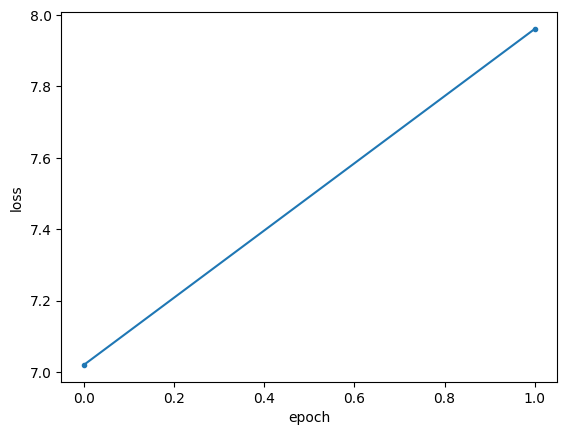

1/1 [==============================] - 1s 505ms/step


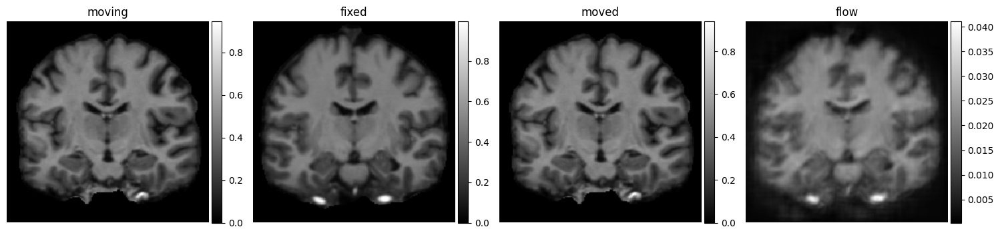

Epoch 1/2
1/1 [==============================] - 0s 62ms/step
10/10 - 10s - loss: 23.0885 - vxm_dense_transformer_loss: 23.0885 - vxm_dense_flow_loss: 1.4757e-08 - val_loss: 0.0305 - val_vxm_dense_transformer_loss: 0.0305 - val_vxm_dense_flow_loss: 1.4602e-08 - 10s/epoch - 981ms/step
Epoch 2/2
1/1 [==============================] - 0s 61ms/step
10/10 - 6s - loss: 14.2336 - vxm_dense_transformer_loss: 14.2336 - vxm_dense_flow_loss: 1.4109e-07 - val_loss: 0.0308 - val_vxm_dense_transformer_loss: 0.0308 - val_vxm_dense_flow_loss: 1.8840e-07 - 6s/epoch - 612ms/step


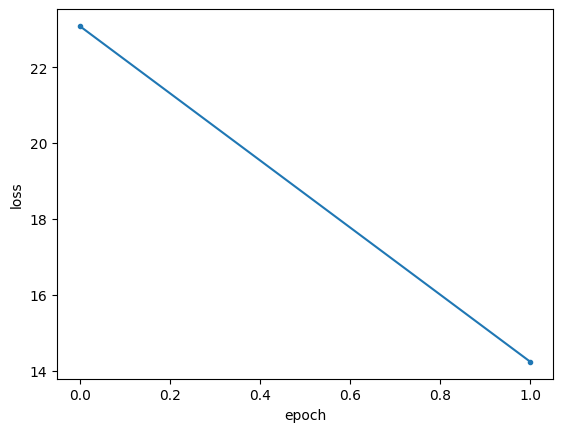

1/1 [==============================] - 0s 401ms/step


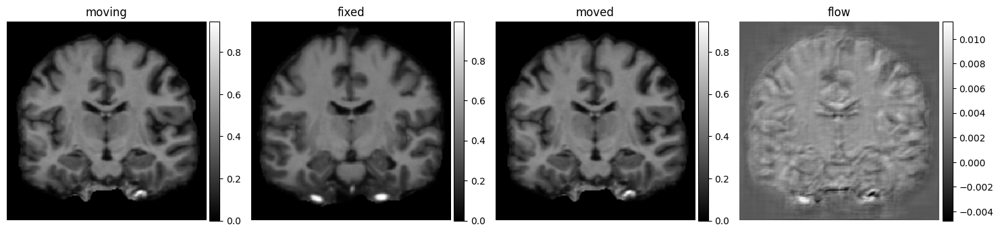

1/1 [==============================] - 0s 72ms/step
Epoch 1/2
10/10 - 8s - loss: 7.6482 - vxm_dense_transformer_loss: 7.6482 - vxm_dense_flow_loss: 2.5208e-07 - val_loss: 0.0302 - val_vxm_dense_transformer_loss: 0.0302 - val_vxm_dense_flow_loss: 7.8219e-07 - 8s/epoch - 845ms/step
Epoch 2/2
1/1 [==============================] - 0s 71ms/step
10/10 - 6s - loss: 14.5023 - vxm_dense_transformer_loss: 14.5023 - vxm_dense_flow_loss: 3.2949e-06 - val_loss: 0.0318 - val_vxm_dense_transformer_loss: 0.0318 - val_vxm_dense_flow_loss: 4.9549e-06 - 6s/epoch - 601ms/step


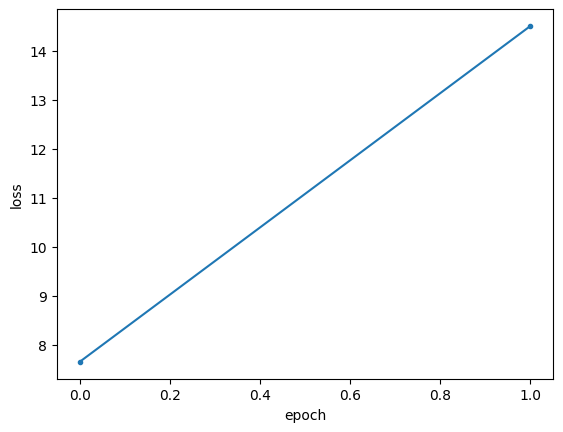

1/1 [==============================] - 0s 365ms/step


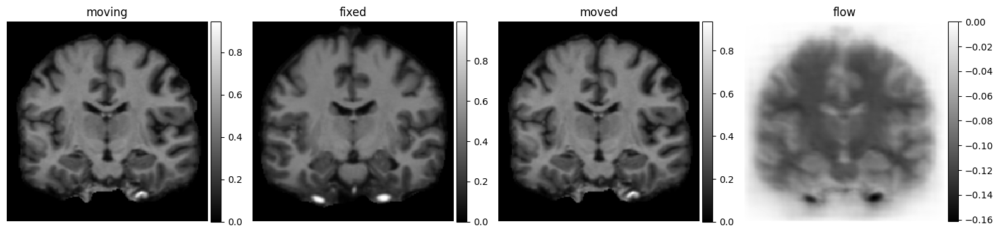

Epoch 1/2
1/1 [==============================] - 0s 78ms/step
10/10 - 11s - loss: 37.4900 - vxm_dense_transformer_loss: 37.4900 - vxm_dense_flow_loss: 1.7432e-06 - val_loss: 0.0313 - val_vxm_dense_transformer_loss: 0.0313 - val_vxm_dense_flow_loss: 2.3158e-06 - 11s/epoch - 1s/step
Epoch 2/2
1/1 [==============================] - 0s 79ms/step
10/10 - 6s - loss: 21.9152 - vxm_dense_transformer_loss: 21.9152 - vxm_dense_flow_loss: 1.1559e-05 - val_loss: 0.0319 - val_vxm_dense_transformer_loss: 0.0319 - val_vxm_dense_flow_loss: 1.8929e-05 - 6s/epoch - 639ms/step


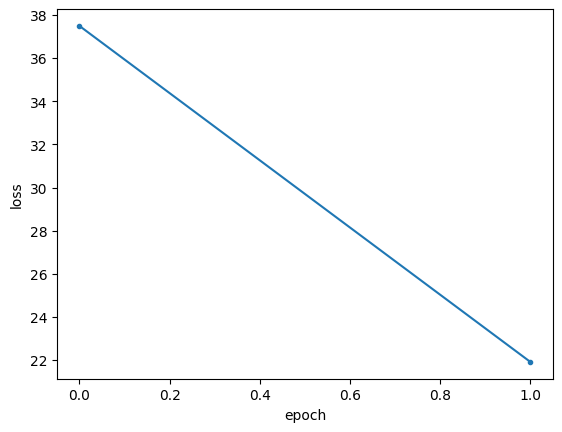

1/1 [==============================] - 0s 463ms/step


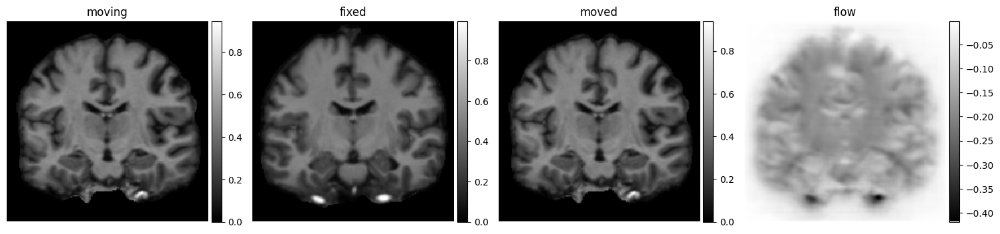

Epoch 1/2
1/1 [==============================] - 0s 106ms/step
10/10 - 10s - loss: 0.0272 - vxm_dense_transformer_loss: 0.0272 - vxm_dense_flow_loss: 3.0515e-07 - val_loss: 0.0312 - val_vxm_dense_transformer_loss: 0.0312 - val_vxm_dense_flow_loss: 1.5553e-06 - 10s/epoch - 977ms/step
Epoch 2/2
1/1 [==============================] - 0s 293ms/step
10/10 - 6s - loss: 22.2114 - vxm_dense_transformer_loss: 22.2114 - vxm_dense_flow_loss: 4.8622e-06 - val_loss: 0.0302 - val_vxm_dense_transformer_loss: 0.0302 - val_vxm_dense_flow_loss: 7.5925e-06 - 6s/epoch - 639ms/step


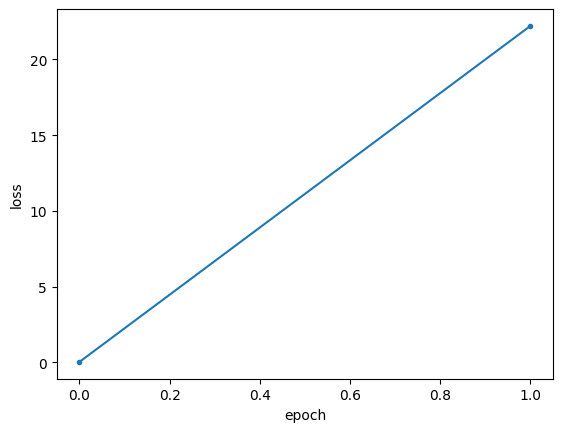

1/1 [==============================] - 0s 432ms/step


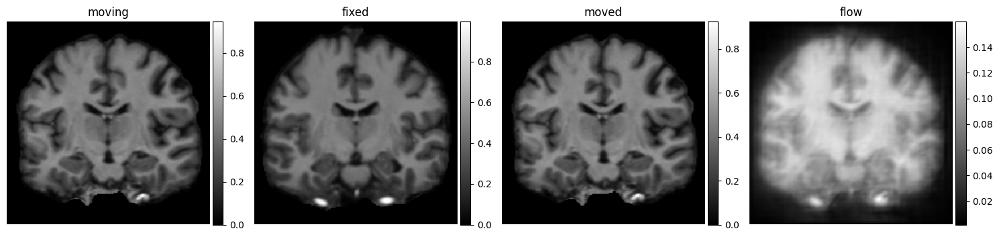

1/1 [==============================] - 0s 71ms/step
Epoch 1/2
1/1 [==============================] - 0s 85ms/step
10/10 - 10s - loss: 36.9513 - vxm_dense_transformer_loss: 36.9513 - vxm_dense_flow_loss: 1.9276e-07 - val_loss: 0.0307 - val_vxm_dense_transformer_loss: 0.0307 - val_vxm_dense_flow_loss: 4.3770e-07 - 10s/epoch - 1s/step
Epoch 2/2
1/1 [==============================] - 0s 237ms/step
10/10 - 6s - loss: 21.4981 - vxm_dense_transformer_loss: 21.4981 - vxm_dense_flow_loss: 3.0489e-06 - val_loss: 0.0310 - val_vxm_dense_transformer_loss: 0.0310 - val_vxm_dense_flow_loss: 7.5197e-06 - 6s/epoch - 627ms/step


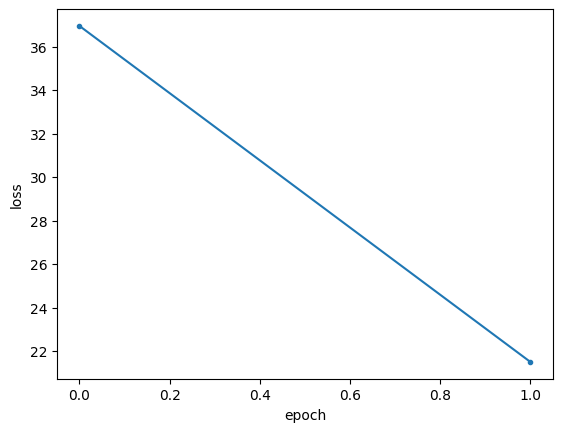

1/1 [==============================] - 1s 520ms/step


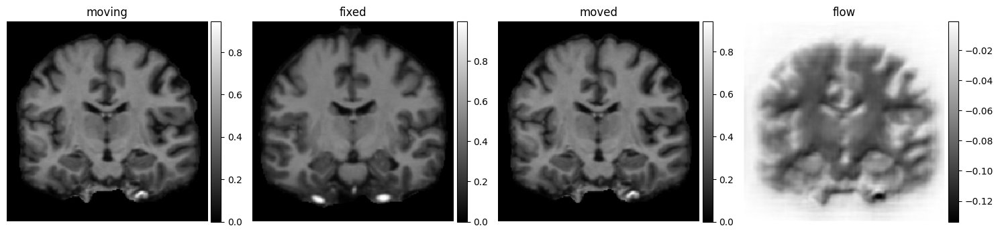

1/1 [==============================] - 0s 74ms/step
Epoch 1/2
1/1 [==============================] - 0s 61ms/step
10/10 - 10s - loss: 35.7285 - vxm_dense_transformer_loss: 35.7285 - vxm_dense_flow_loss: 2.1976e-07 - val_loss: 0.0306 - val_vxm_dense_transformer_loss: 0.0306 - val_vxm_dense_flow_loss: 3.3474e-07 - 10s/epoch - 1s/step
Epoch 2/2
1/1 [==============================] - 0s 50ms/step
10/10 - 7s - loss: 37.4483 - vxm_dense_transformer_loss: 37.4483 - vxm_dense_flow_loss: 3.3830e-06 - val_loss: 0.0299 - val_vxm_dense_transformer_loss: 0.0299 - val_vxm_dense_flow_loss: 5.5547e-06 - 7s/epoch - 690ms/step


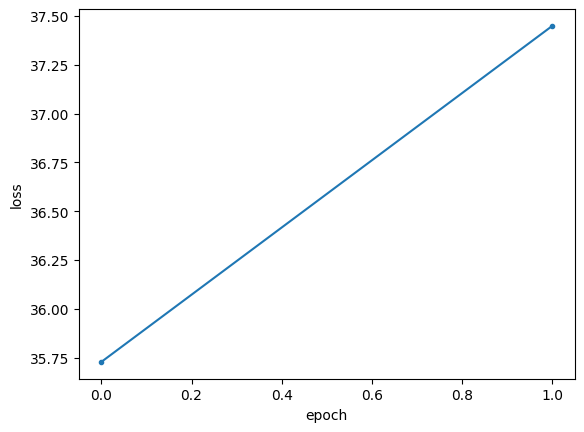

1/1 [==============================] - 0s 297ms/step


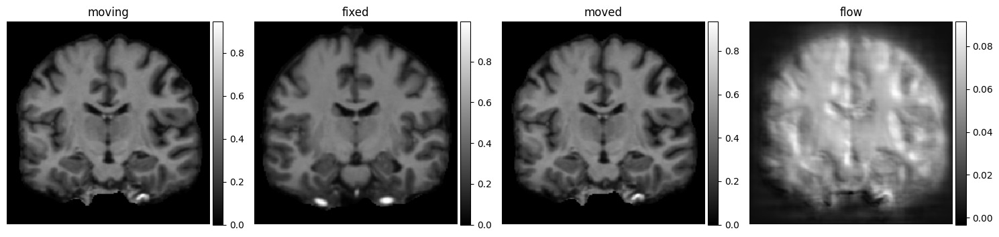

1/1 [==============================] - 0s 66ms/step
Epoch 1/2
1/1 [==============================] - 0s 93ms/step
10/10 - 11s - loss: 37.5795 - vxm_dense_transformer_loss: 37.5795 - vxm_dense_flow_loss: 6.7178e-07 - val_loss: 0.0312 - val_vxm_dense_transformer_loss: 0.0312 - val_vxm_dense_flow_loss: 8.5140e-07 - 11s/epoch - 1s/step
Epoch 2/2
1/1 [==============================] - 0s 255ms/step
10/10 - 7s - loss: 37.0220 - vxm_dense_transformer_loss: 37.0220 - vxm_dense_flow_loss: 8.2796e-06 - val_loss: 0.0308 - val_vxm_dense_transformer_loss: 0.0308 - val_vxm_dense_flow_loss: 1.1281e-05 - 7s/epoch - 707ms/step


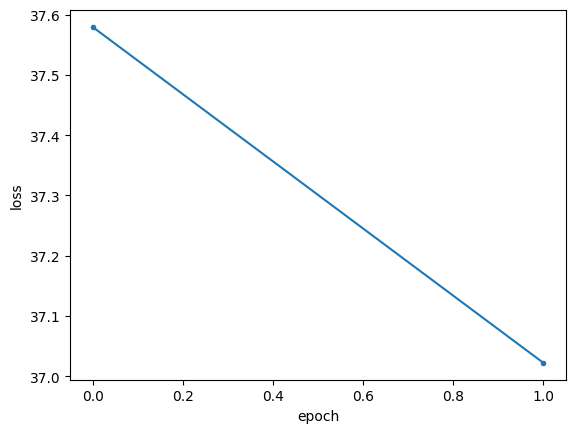

1/1 [==============================] - 0s 380ms/step


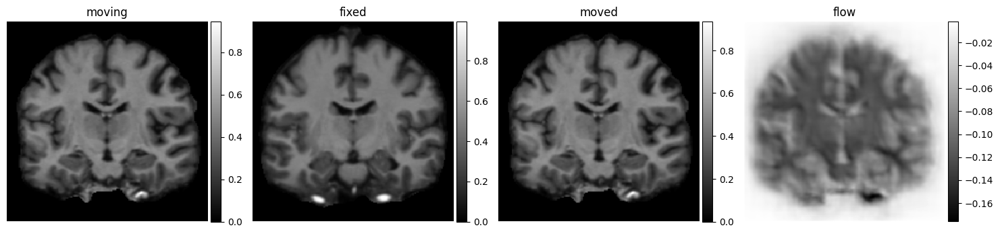

1/1 [==============================] - 0s 77ms/step
Epoch 1/2
1/1 [==============================] - 0s 64ms/step
10/10 - 9s - loss: 20.5802 - vxm_dense_transformer_loss: 20.5802 - vxm_dense_flow_loss: 3.4489e-07 - val_loss: 0.0306 - val_vxm_dense_transformer_loss: 0.0306 - val_vxm_dense_flow_loss: 1.0776e-06 - 9s/epoch - 890ms/step
Epoch 2/2
1/1 [==============================] - 0s 248ms/step
10/10 - 7s - loss: 36.5619 - vxm_dense_transformer_loss: 36.5619 - vxm_dense_flow_loss: 7.9427e-06 - val_loss: 0.0305 - val_vxm_dense_transformer_loss: 0.0305 - val_vxm_dense_flow_loss: 8.8276e-06 - 7s/epoch - 693ms/step


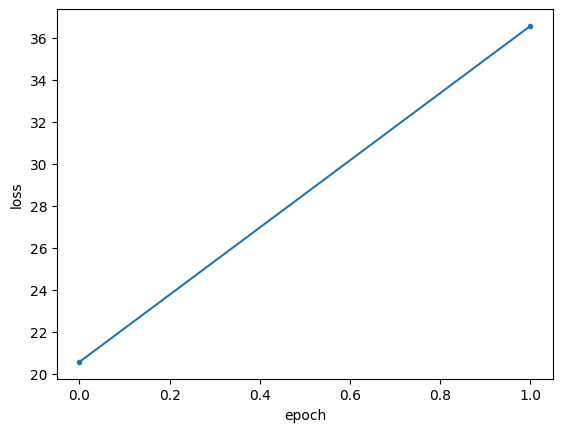

1/1 [==============================] - 0s 337ms/step


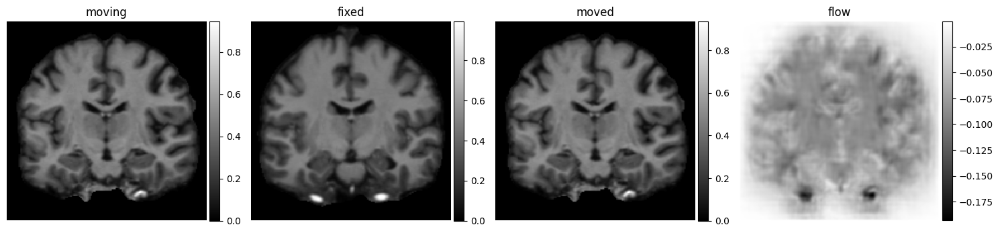

1/1 [==============================] - 0s 57ms/step
Epoch 1/2
1/1 [==============================] - 0s 73ms/step
10/10 - 10s - loss: 51.1435 - vxm_dense_transformer_loss: 51.1435 - vxm_dense_flow_loss: 1.5569e-06 - val_loss: 0.0310 - val_vxm_dense_transformer_loss: 0.0310 - val_vxm_dense_flow_loss: 2.8087e-06 - 10s/epoch - 1s/step
Epoch 2/2
1/1 [==============================] - 0s 60ms/step
10/10 - 7s - loss: 52.1468 - vxm_dense_transformer_loss: 52.1468 - vxm_dense_flow_loss: 2.8644e-05 - val_loss: 0.0313 - val_vxm_dense_transformer_loss: 0.0313 - val_vxm_dense_flow_loss: 3.5153e-05 - 7s/epoch - 720ms/step


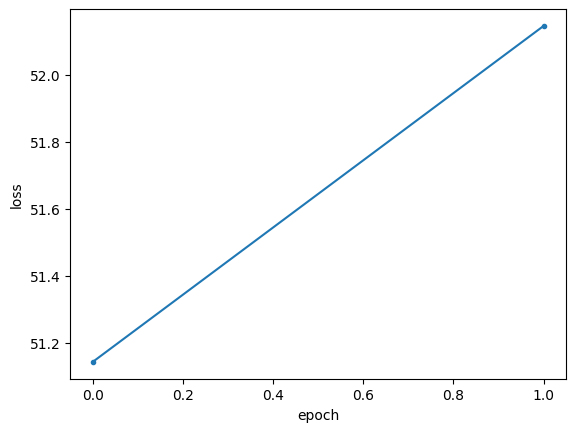

1/1 [==============================] - 0s 317ms/step


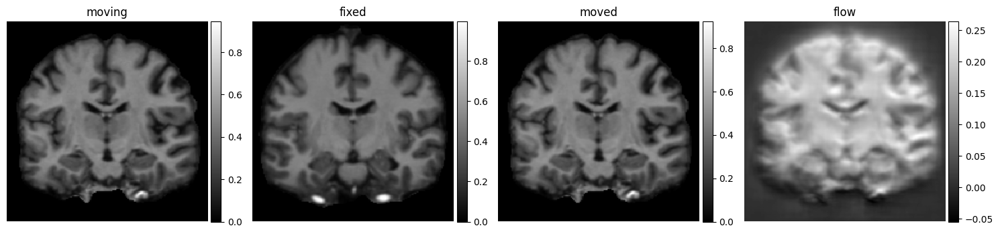

1/1 [==============================] - 0s 54ms/step
Epoch 1/2
1/1 [==============================] - 0s 67ms/step
10/10 - 10s - loss: 44.1982 - vxm_dense_transformer_loss: 44.1982 - vxm_dense_flow_loss: 2.4530e-07 - val_loss: 0.0309 - val_vxm_dense_transformer_loss: 0.0309 - val_vxm_dense_flow_loss: 4.5022e-07 - 10s/epoch - 965ms/step
Epoch 2/2
1/1 [==============================] - 0s 268ms/step
10/10 - 8s - loss: 54.3408 - vxm_dense_transformer_loss: 54.3408 - vxm_dense_flow_loss: 5.0485e-06 - val_loss: 0.0308 - val_vxm_dense_transformer_loss: 0.0308 - val_vxm_dense_flow_loss: 6.1680e-06 - 8s/epoch - 750ms/step


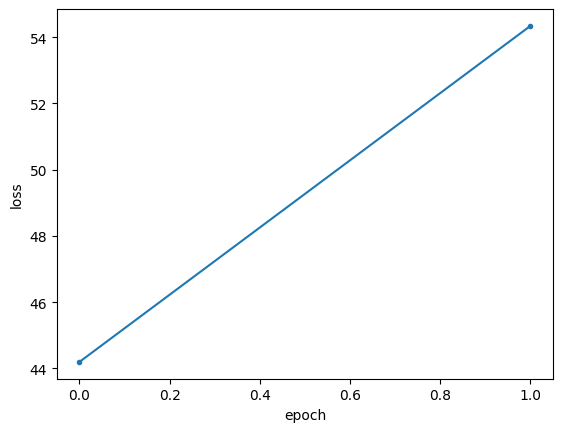

1/1 [==============================] - 0s 309ms/step


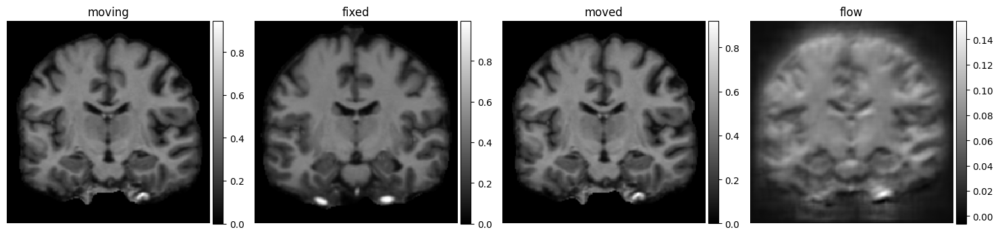

1/1 [==============================] - 0s 63ms/step
Epoch 1/2
1/1 [==============================] - 0s 73ms/step
10/10 - 10s - loss: 58.5914 - vxm_dense_transformer_loss: 58.5914 - vxm_dense_flow_loss: 4.5860e-07 - val_loss: 0.0318 - val_vxm_dense_transformer_loss: 0.0318 - val_vxm_dense_flow_loss: 9.8754e-07 - 10s/epoch - 1s/step
Epoch 2/2
1/1 [==============================] - 0s 250ms/step
10/10 - 7s - loss: 44.3651 - vxm_dense_transformer_loss: 44.3651 - vxm_dense_flow_loss: 8.3267e-06 - val_loss: 0.0303 - val_vxm_dense_transformer_loss: 0.0303 - val_vxm_dense_flow_loss: 1.2486e-05 - 7s/epoch - 698ms/step


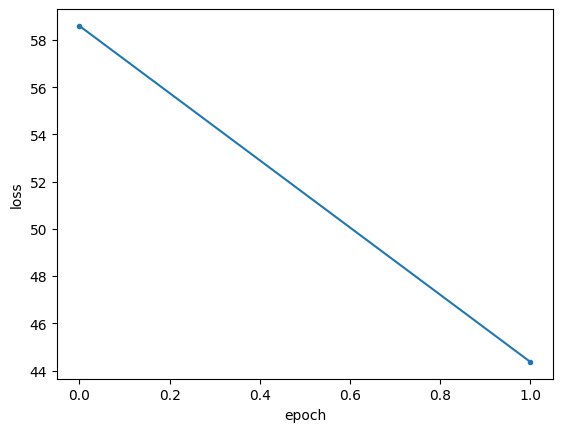

1/1 [==============================] - 0s 322ms/step


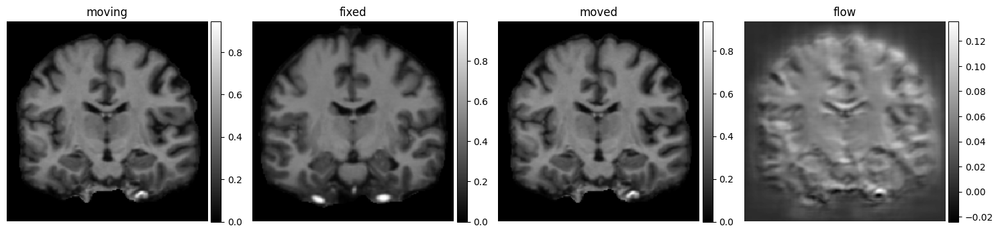

1/1 [==============================] - 0s 62ms/step
Epoch 1/2
1/1 [==============================] - 0s 63ms/step
10/10 - 10s - loss: 49.9038 - vxm_dense_transformer_loss: 49.9038 - vxm_dense_flow_loss: 1.8982e-06 - val_loss: 0.0312 - val_vxm_dense_transformer_loss: 0.0312 - val_vxm_dense_flow_loss: 3.1895e-06 - 10s/epoch - 958ms/step
Epoch 2/2
1/1 [==============================] - 0s 66ms/step
10/10 - 7s - loss: 43.7569 - vxm_dense_transformer_loss: 43.7569 - vxm_dense_flow_loss: 2.5801e-05 - val_loss: 0.0311 - val_vxm_dense_transformer_loss: 0.0311 - val_vxm_dense_flow_loss: 3.1729e-05 - 7s/epoch - 674ms/step


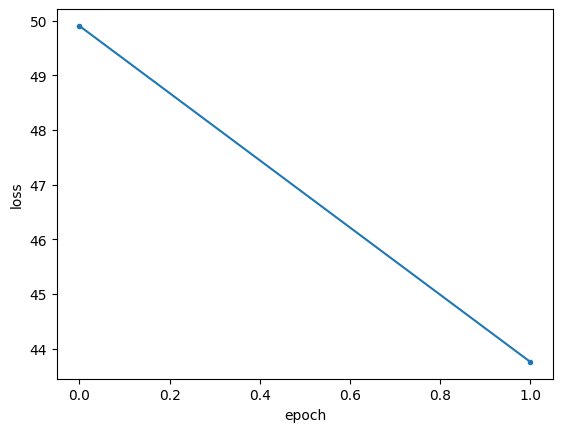

1/1 [==============================] - 0s 312ms/step


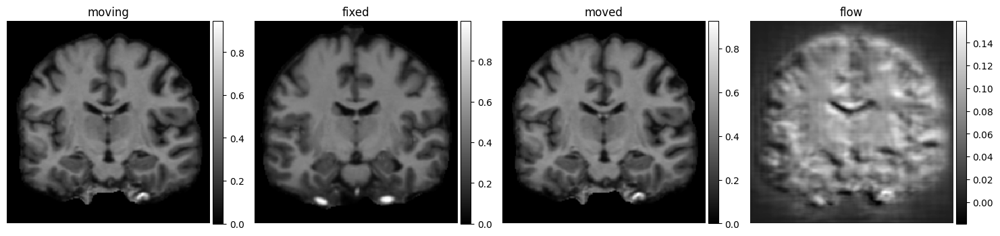

1/1 [==============================] - 0s 58ms/step
Epoch 1/2
1/1 [==============================] - 0s 60ms/step
10/10 - 10s - loss: 68.0972 - vxm_dense_transformer_loss: 68.0972 - vxm_dense_flow_loss: 5.8187e-07 - val_loss: 0.0311 - val_vxm_dense_transformer_loss: 0.0311 - val_vxm_dense_flow_loss: 9.6191e-07 - 10s/epoch - 1s/step
Epoch 2/2
1/1 [==============================] - 0s 218ms/step
10/10 - 7s - loss: 35.8807 - vxm_dense_transformer_loss: 35.8807 - vxm_dense_flow_loss: 7.0514e-06 - val_loss: 0.0311 - val_vxm_dense_transformer_loss: 0.0311 - val_vxm_dense_flow_loss: 7.8241e-06 - 7s/epoch - 697ms/step


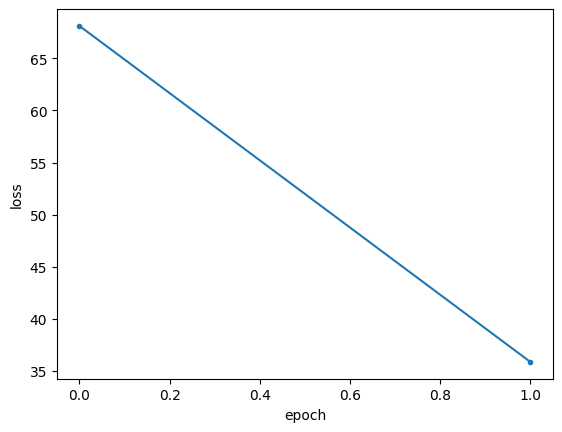

1/1 [==============================] - 0s 317ms/step


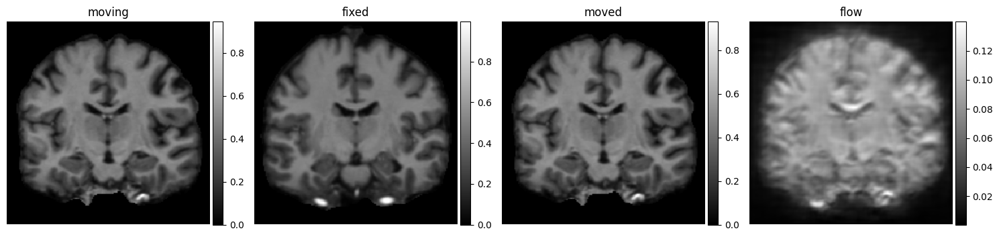

1/1 [==============================] - 0s 63ms/step
Epoch 1/2
1/1 [==============================] - 0s 65ms/step
10/10 - 11s - loss: 67.7128 - vxm_dense_transformer_loss: 67.7128 - vxm_dense_flow_loss: 3.7726e-07 - val_loss: 0.0308 - val_vxm_dense_transformer_loss: 0.0308 - val_vxm_dense_flow_loss: 4.2816e-07 - 11s/epoch - 1s/step
Epoch 2/2
1/1 [==============================] - 0s 270ms/step
10/10 - 9s - loss: 65.9066 - vxm_dense_transformer_loss: 65.9066 - vxm_dense_flow_loss: 8.5454e-06 - val_loss: 0.0309 - val_vxm_dense_transformer_loss: 0.0309 - val_vxm_dense_flow_loss: 6.4978e-06 - 9s/epoch - 865ms/step


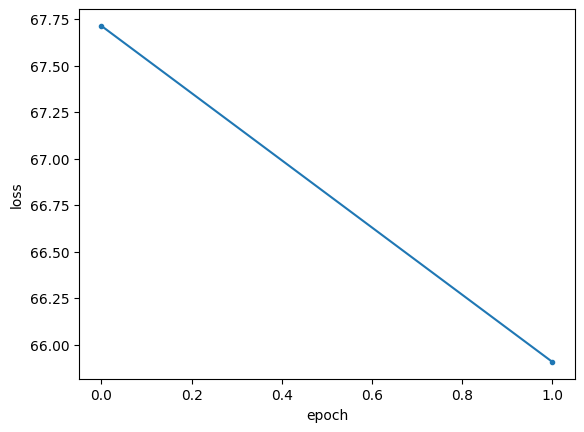

1/1 [==============================] - 1s 517ms/step


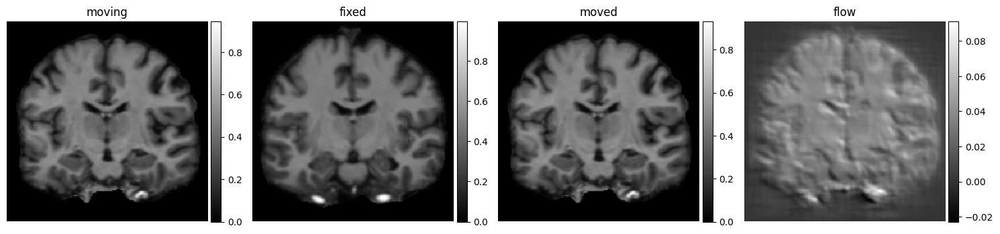

1/1 [==============================] - 0s 58ms/step
Epoch 1/2
1/1 [==============================] - 0s 66ms/step
10/10 - 11s - loss: 62.1938 - vxm_dense_transformer_loss: 62.1938 - vxm_dense_flow_loss: 1.1510e-06 - val_loss: 0.0312 - val_vxm_dense_transformer_loss: 0.0312 - val_vxm_dense_flow_loss: 2.0661e-06 - 11s/epoch - 1s/step
Epoch 2/2
1/1 [==============================] - 0s 67ms/step
10/10 - 7s - loss: 61.1676 - vxm_dense_transformer_loss: 61.1676 - vxm_dense_flow_loss: 2.6328e-05 - val_loss: 0.0315 - val_vxm_dense_transformer_loss: 0.0315 - val_vxm_dense_flow_loss: 3.7582e-05 - 7s/epoch - 736ms/step


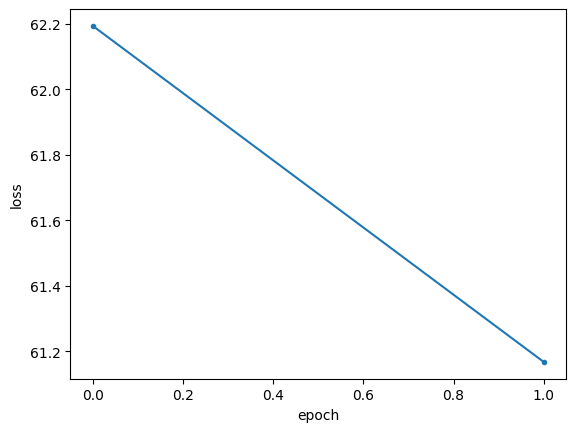

1/1 [==============================] - 0s 372ms/step


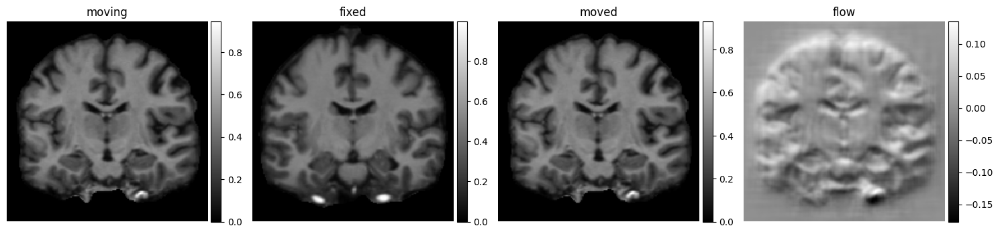

1/1 [==============================] - 0s 59ms/step
Epoch 1/2
1/1 [==============================] - 0s 113ms/step
10/10 - 12s - loss: 67.4831 - vxm_dense_transformer_loss: 67.4831 - vxm_dense_flow_loss: 4.1536e-07 - val_loss: 0.0317 - val_vxm_dense_transformer_loss: 0.0317 - val_vxm_dense_flow_loss: 3.8362e-07 - 12s/epoch - 1s/step
Epoch 2/2
1/1 [==============================] - 0s 265ms/step
10/10 - 8s - loss: 74.0555 - vxm_dense_transformer_loss: 74.0555 - vxm_dense_flow_loss: 7.7318e-06 - val_loss: 0.0316 - val_vxm_dense_transformer_loss: 0.0316 - val_vxm_dense_flow_loss: 6.2394e-06 - 8s/epoch - 838ms/step


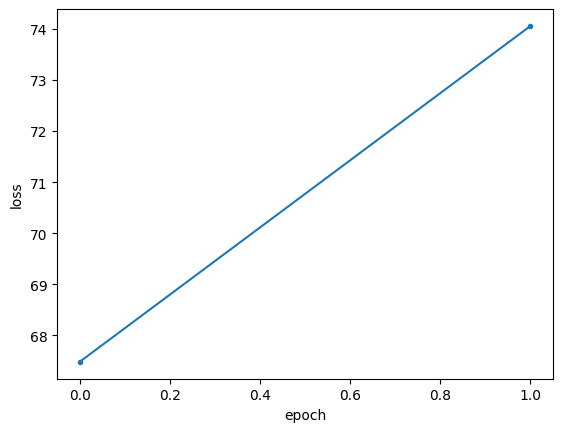

1/1 [==============================] - 0s 323ms/step


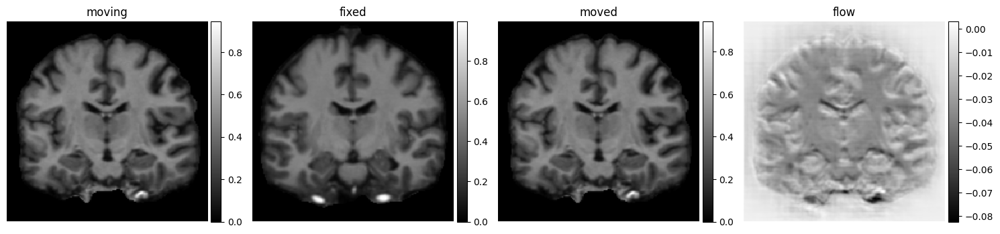

In [17]:
for k in range(5, 95, 5):
    exec(f'Hybr_{k} = VxmTest()')
    exec(f'Hybr_{k}.CNNvxm(real_gen=few_generator, synth_gen=synth_generator, val_generator=val_generator, alpha_real=k/100)')
    exec(f'Hybr_{k}.train(total_epo = train_no)')
    exec(f'hybr_{k} = Hybr_{k}.RegPred(val_input)[1]')
    

1/1 [==============================] - 0s 322ms/step


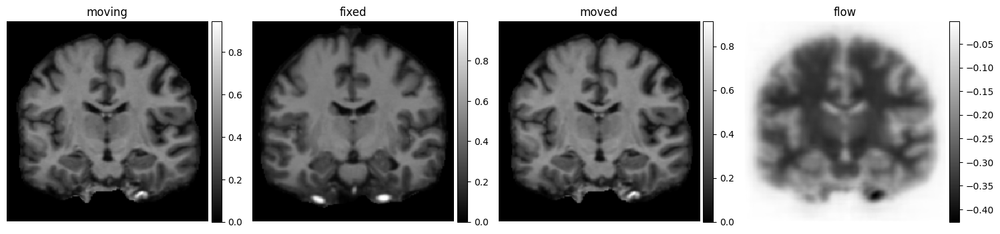

1/1 [==============================] - 0s 412ms/step


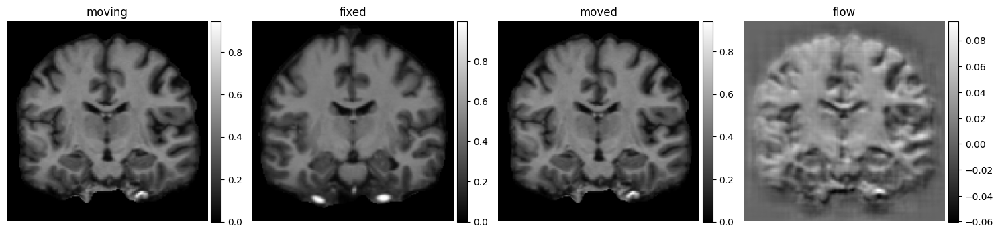

In [18]:
real = Real.RegPred(val_input)[1]
synth = Synth.RegPred(val_input)[1]

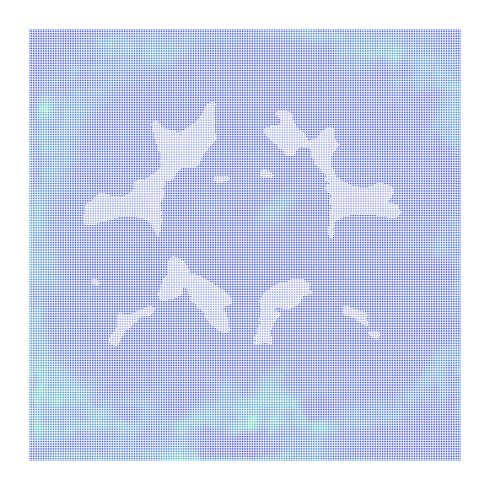

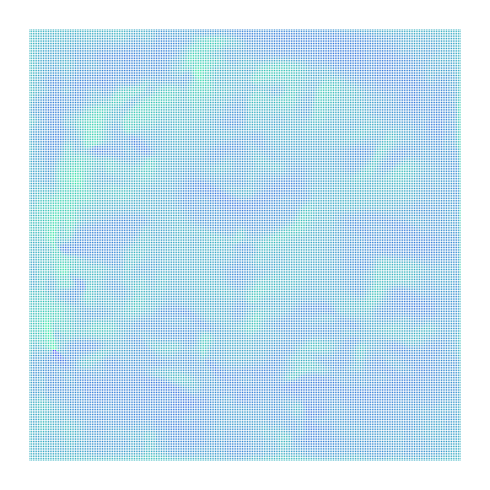

In [19]:
ne.plot.flow([real[1].squeeze()], width=5);
ne.plot.flow([synth[1].squeeze()], width=5);

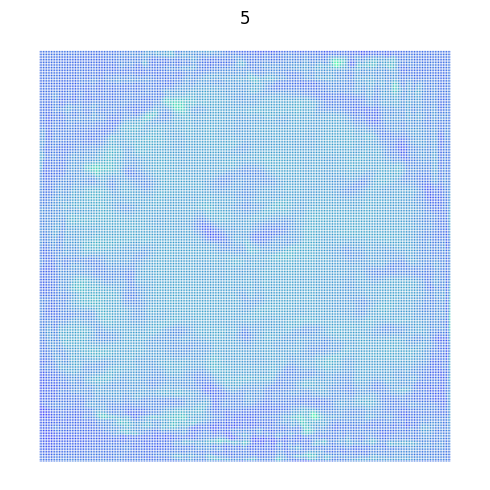

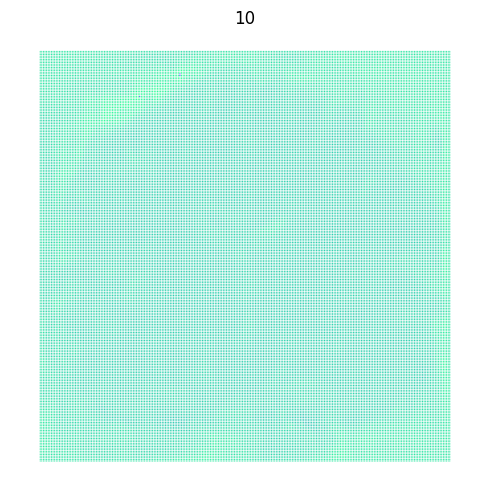

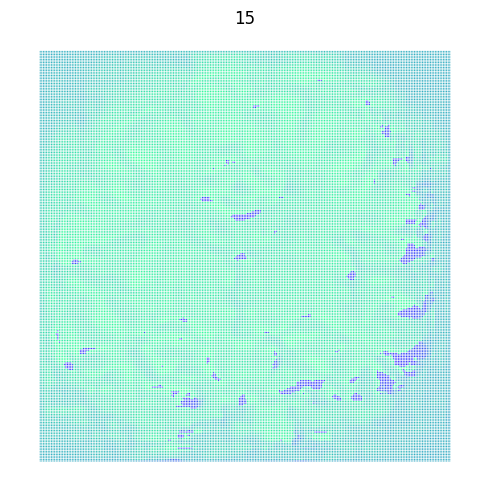

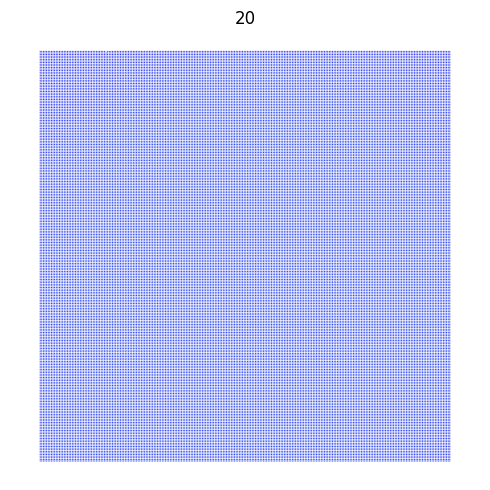

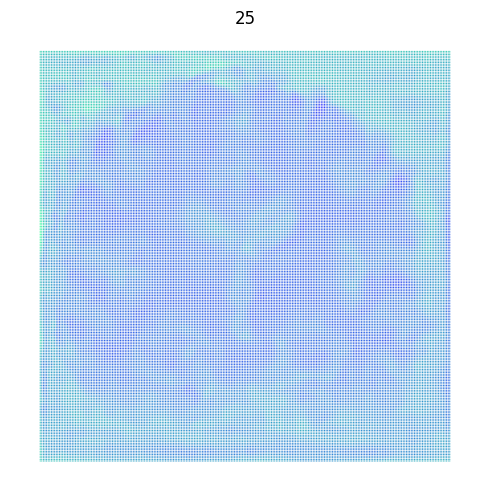

...

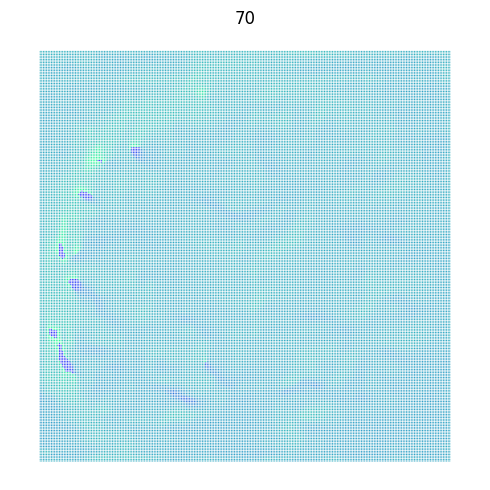

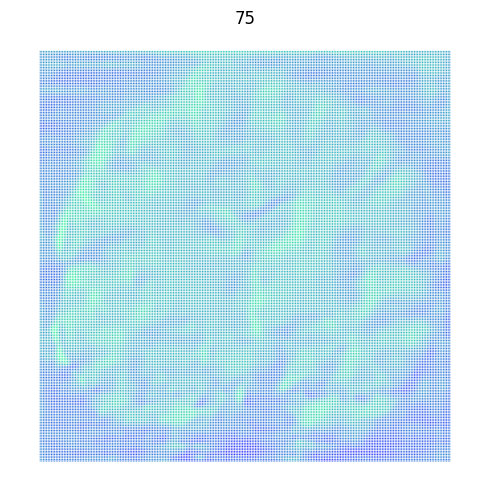

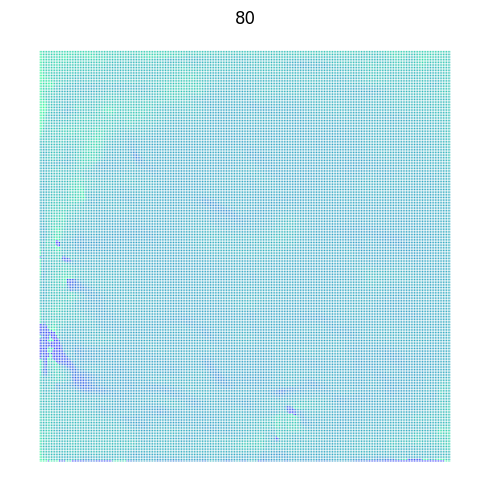

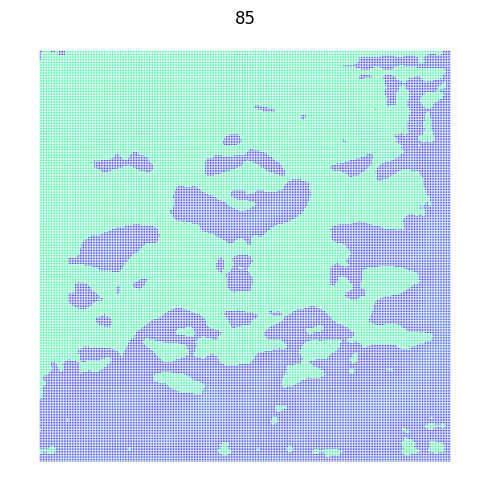

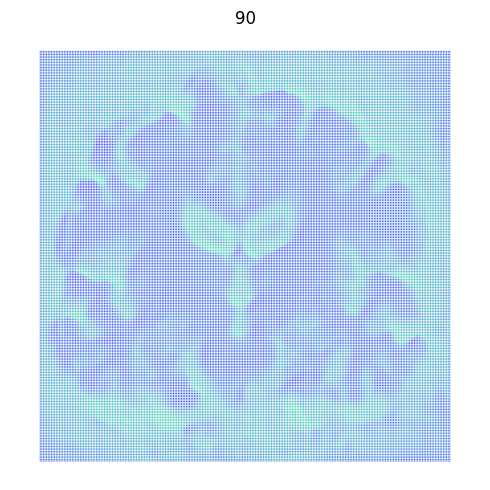

In [22]:
for k in range(5, 95, 5):
    exec(f'ne.plot.flow([hybr_{k}[1].squeeze()],titles=k, width=5);')